In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# SVG格式的图像更清晰
%config InlineBackend.figure_format = 'svg'

In [ ]:
# 增加默认的绘图尺寸
from pylab import rcParams
rcParams['figure.figsize'] = 5, 4

In [ ]:
df_original = pd.DataFrame(pd.read_excel('../TFLearn/personalroadriskassessv2.xlsx'))
df_original.head(5)

In [187]:
# 数据处理
# 驾龄空值用平均值取代
df_original['jl'] = df_original['jl'].fillna(df_original['jl'].mean())
df_original['xb'] = df_original['xb'].fillna(method='ffill')
df_original['WFJFS'] = df_original['WFJFS'].fillna(0)

# 移除列
df = df_original.drop(['id','WFSJ'],1)



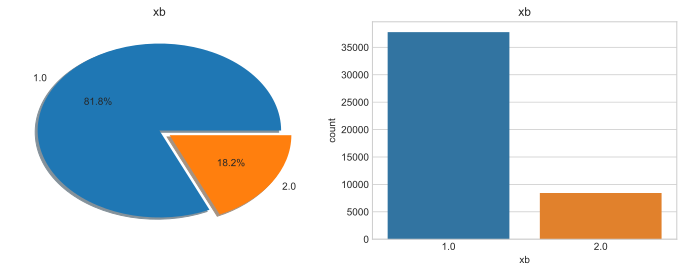

In [190]:
f,ax=plt.subplots(1,2,figsize=(12,4))
df['xb'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('xb')
ax[0].set_ylabel('')
sns.countplot('xb',data=df,ax=ax[1])
ax[1].set_title('xb')
plt.show()

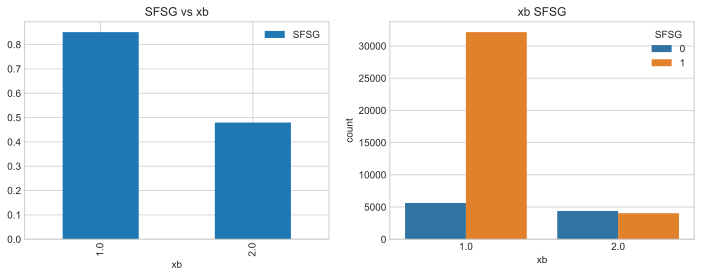

In [191]:
f,ax=plt.subplots(1,2,figsize=(12,4))
df[['xb','SFSG']].groupby(['xb']).mean().plot.bar(ax=ax[0])
ax[0].set_title('SFSG vs xb')
sns.countplot('xb',hue='SFSG',data=df,ax=ax[1])
ax[1].set_title('xb SFSG')
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3c7a2128>,
      dtype=object)

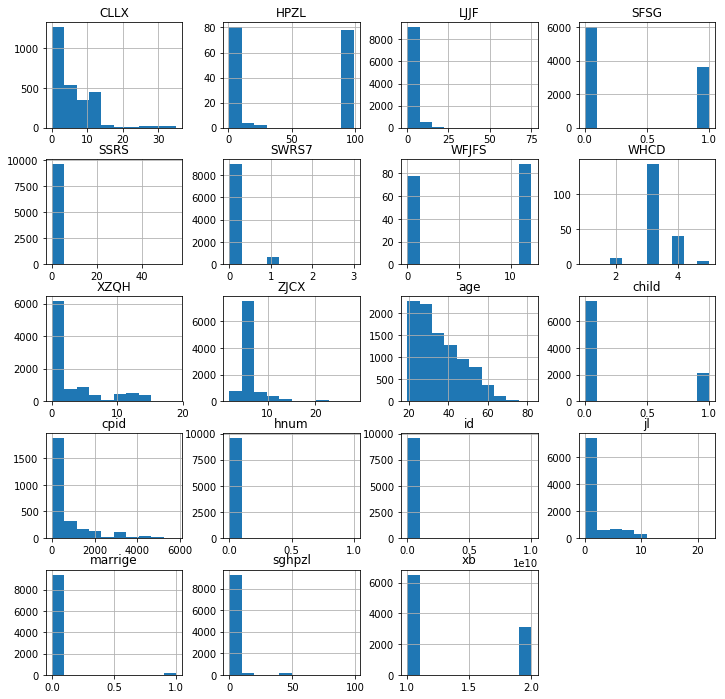

In [17]:
# 直方图
df.hist(figsize=(12, 12))

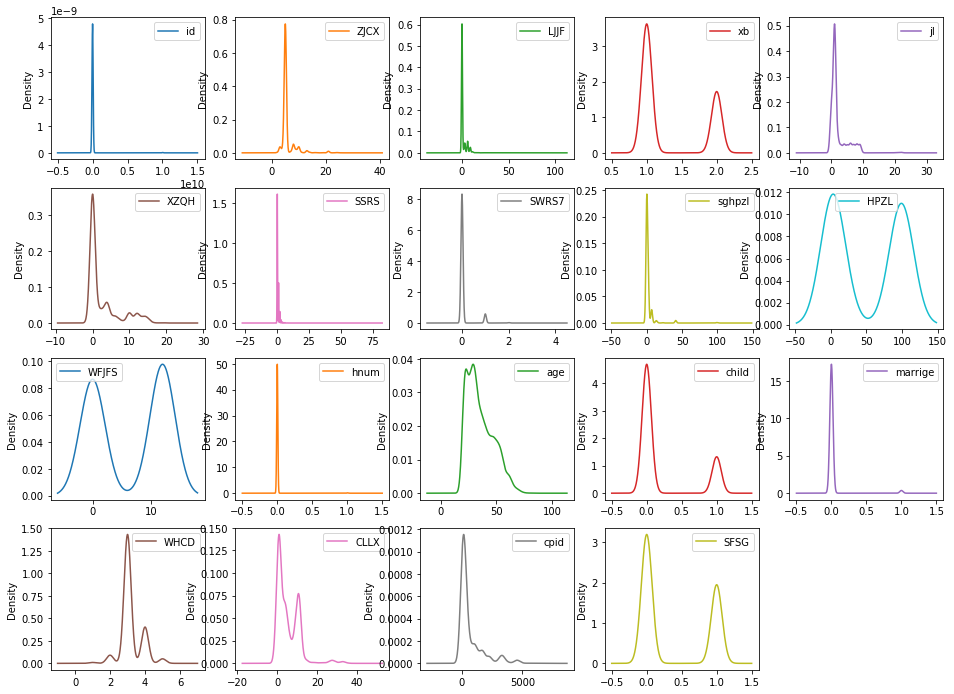

In [20]:
# 密度图
df.plot(kind='density', subplots=True, layout=(4,5), sharex=False, figsize=(16, 12));


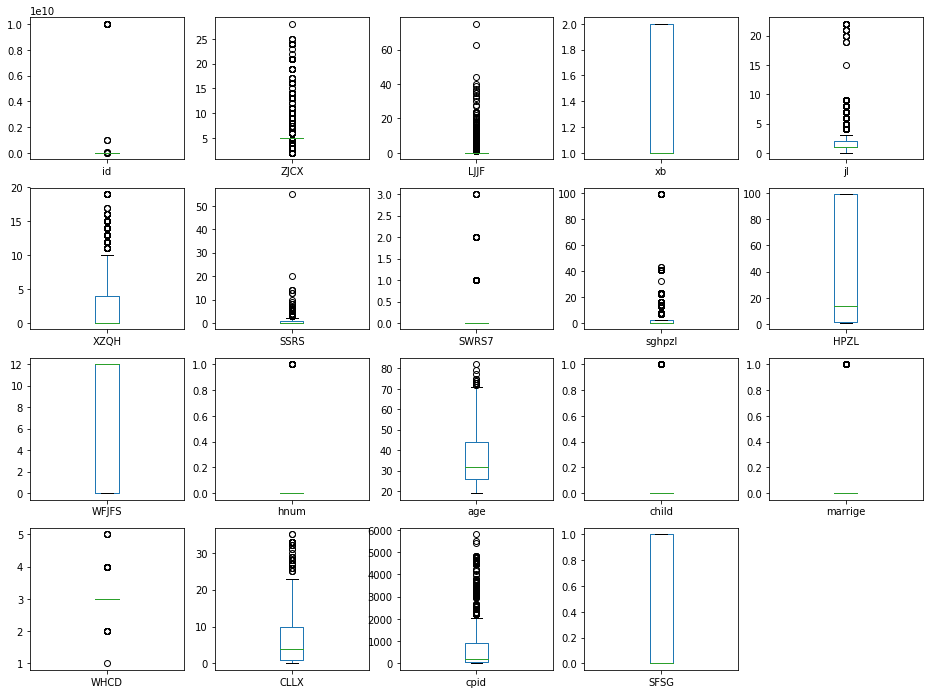

In [21]:
# 箱线图
df.plot(kind='box', subplots=True, layout=(4,5), sharex=False, figsize=(16, 12));

In [ ]:
# x  = np.artuple(df['age'])
sns.distplot(np.array(df['age']))
# type(df['age'])
# type(tuple(df['age']))
fig = plt.figure()
res = stats.probplot(df['age'], plot=plt)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


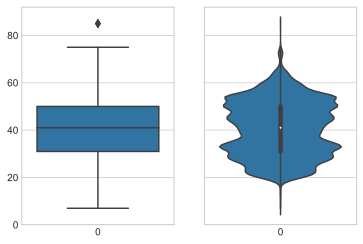

In [193]:
# 提琴形图
_, axes = plt.subplots(1, 2, sharey=True, figsize=(6, 4))
sns.boxplot(data=df['age'], ax=axes[0]); sns.violinplot(data=df['age'], ax=axes[1]);

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


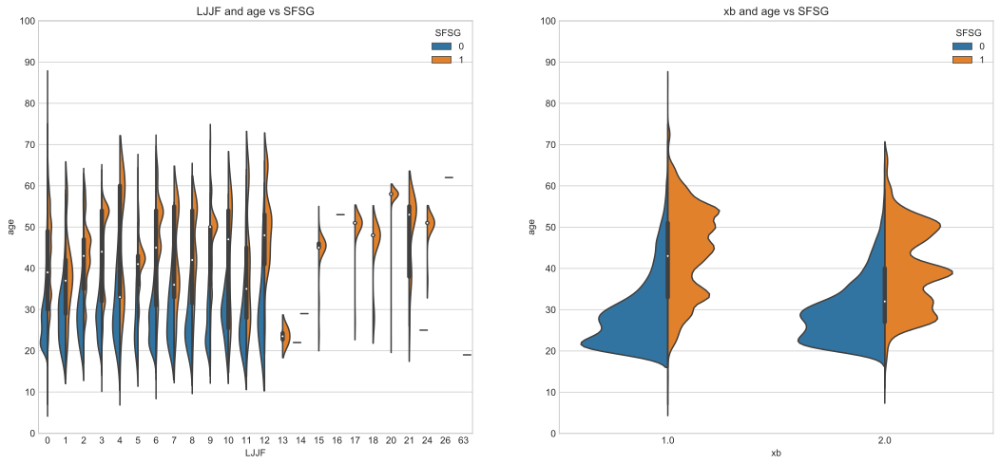

In [194]:
f,ax=plt.subplots(1,2,figsize=(18,8))
sns.violinplot("LJJF","age", hue="SFSG", data=df,split=True,ax=ax[0])
ax[0].set_title('LJJF and age vs SFSG')
ax[0].set_yticks(range(0,110,10))
sns.violinplot("xb","age", hue="SFSG", data=df,split=True,ax=ax[1])
ax[1].set_title('xb and age vs SFSG')
ax[1].set_yticks(range(0,110,10))
plt.show()

In [195]:
# 数据分布精确数值统计
df['age'].describe()

count    46203.000000
mean        40.657100
std         11.741611
min          7.000000
25%         31.000000
50%         41.000000
75%         50.000000
max         85.000000
Name: age, dtype: float64

In [196]:
# 频率表
df['xb'].value_counts()

1.0    37772
2.0     8431
Name: xb, dtype: int64

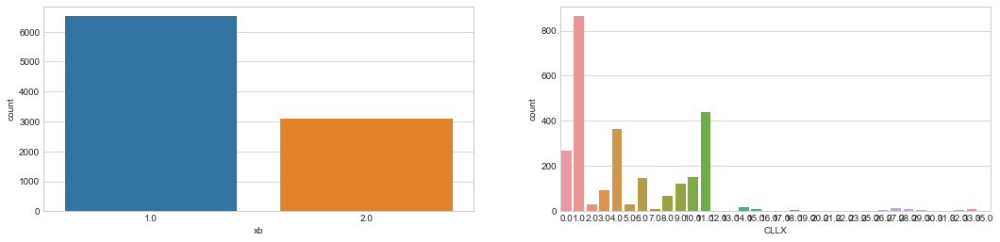

In [178]:
# 条形图 
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))

sns.countplot(x='xb', data=df, ax=axes[0]);
sns.countplot(x='CLLX', data=df, ax=axes[1]);

# 直方图用于查看数值变量的分布，而条形图用于类别特征。
# 直方图的X轴是数值；条形图的X轴可能是任何类型：数字、字符串、布尔值。
# 直方图的X轴是一根笛卡尔坐标轴；条形的顺序没有事先定义。
# 不过，值得注意的是，条形经常按照高度排序，也就是值的频率。
# 同时，当我们考虑有序变量（例如Customer service calls（客服呼叫数））时，条形通常按照变量的值排序。

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


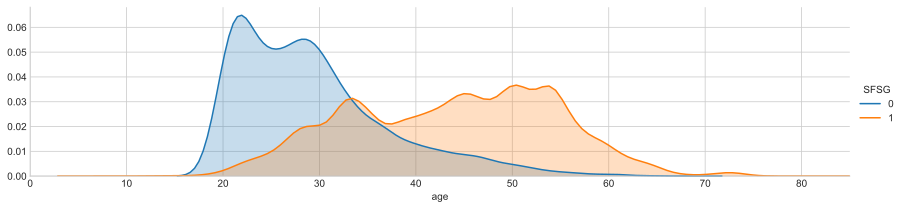

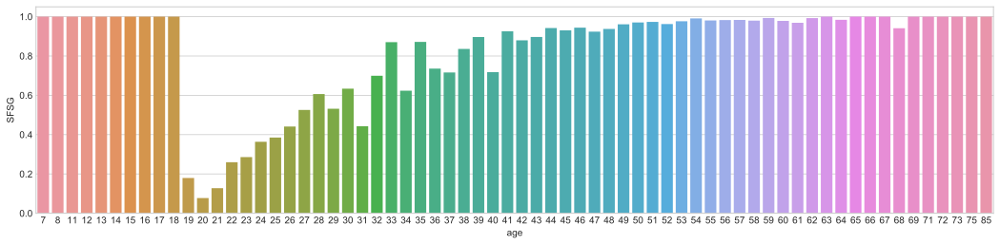

In [197]:
# peaks for survived/not survived passengers by their age
facet = sns.FacetGrid(df, hue="SFSG",aspect=4)
facet.map(sns.kdeplot,'age',shade= True)
facet.set(xlim=(0, df['age'].max()))
facet.add_legend()

# average survived passengers by age
fig, axis1 = plt.subplots(1,1,figsize=(18,4))
average_age = df[["age", "SFSG"]].groupby(['age'],as_index=False).mean()
sns.barplot(x='age', y='SFSG', data=average_age)

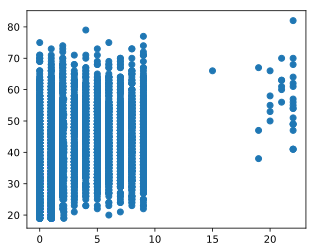

In [49]:
# 散点图 将两个数值变量的值显示为二位空间中的笛卡尔坐标（Cartesian coordinate）。
plt.scatter(df['jl'], df['age']);

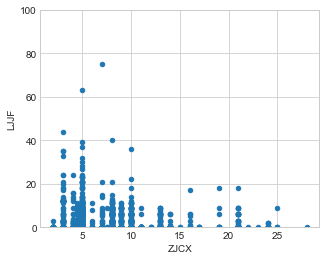

In [161]:
data = pd.concat([df['LJJF'], df['ZJCX']], axis=1)
data.plot.scatter(x='ZJCX', y='LJJF', ylim=(0,100));

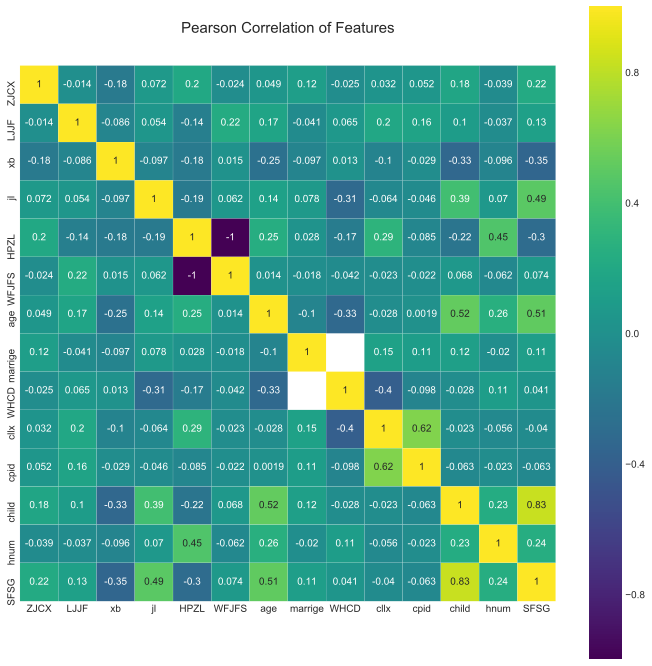

In [198]:


#  'ZJCX', 'LJJF', 'xb', 'jl', 'CLLX', 'marrige', 'child', 'hnum',
#     'age', 'XZQH','SSRS','SWRS7','sghpzl'

colormap = plt.cm.viridis
plt.figure(figsize=(12,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(df.astype(float).corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True, xticklabels=True, yticklabels=True)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


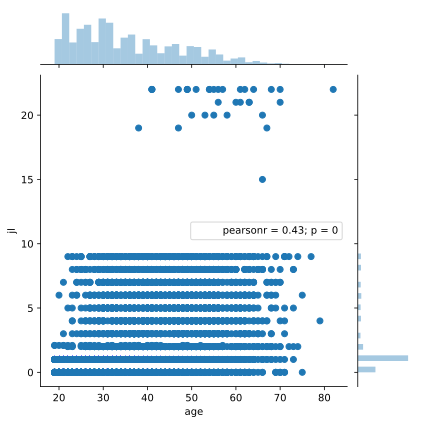

In [50]:
# seaborn库创建的散点图有一个略微奇特的选项：
sns.jointplot(x='age', y='jl',
              data=df, kind='scatter');

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kernels.py:128: RuntimeWarning: divide by zero encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kernels.py:128: RuntimeWarning: invalid value encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/_kernel_base.py:514: RuntimeWarning: invalid value encountered in true_divide
  dens = Kval.prod(axis=1) /

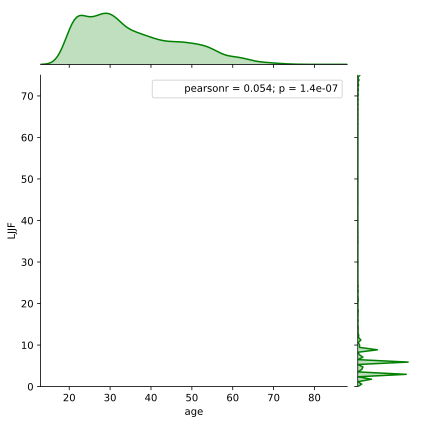

In [48]:
sns.jointplot(x='age', y='LJJF',
              data=df, kind="kde", color="g")

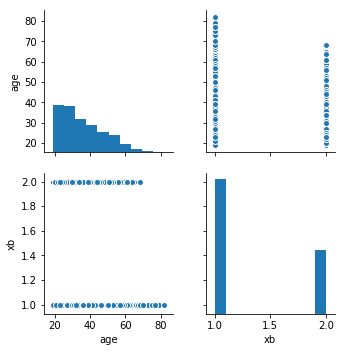

In [57]:
# 散点图矩阵
# pd.plotting.scatter_matrix(df, alpha=0.7, figsize=(14,8), diagonal='kde')
# ptl.show()
# import mglearn
# pd.plotting.scatter_matrix(df['age'],marker='o',hist_kwds={'bins':20},cmap=mglearn.cm3, figsize=(14,8))
%config InlineBackend.figure_format = 'png'
type(df[['age','xb']])

sns.pairplot(df[['age','xb']]);

In [199]:
# 同一张图像中包括第三个类别变量的值,散点图中的数据点之前的scatter()函数达成这一点，不过，这次让我们换换花样，用lmplot()函数的hue参数来指定感兴趣的类别特征
sns.lmplot(
    'age', 'LJJF', data=df, hue='SFSG', fit_reg=False)

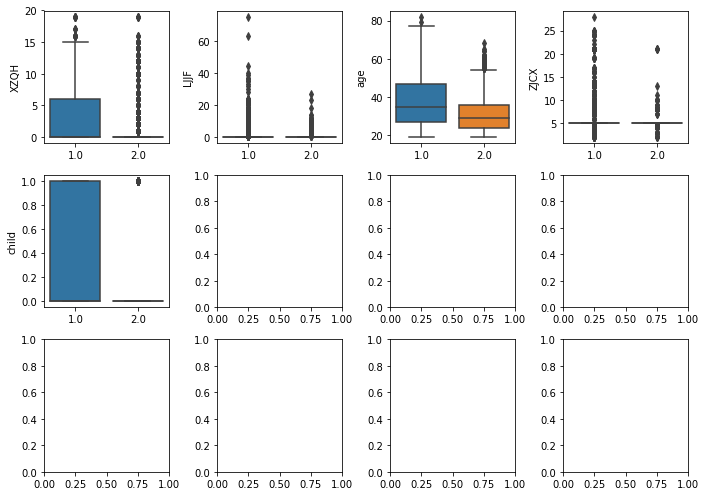

In [64]:
# 箱形图，以可视化两个互斥分组中的数值变量分布的统计数据
# 有时我们可以将有序变量作为数值变量分析


fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7))

for idx, feat in enumerate(df[['XZQH','LJJF','age','ZJCX','child']]): 
    ax = axes[int(idx / 4), idx % 4] 
    sns.boxplot(x='xb', y=feat, data=df, ax=ax) 
    ax.set_xlabel('') 
    ax.set_ylabel(feat) 
fig.tight_layout();

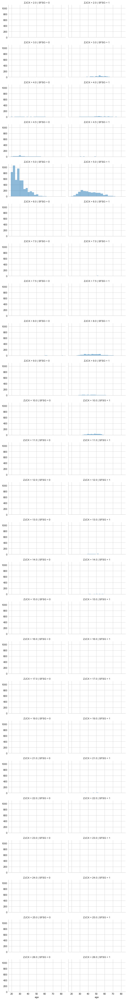

In [163]:
grid = sns.FacetGrid(df, col='SFSG', row='ZJCX', size=2.2, aspect=1.6)
grid.map(plt.hist, 'age', alpha=.5, bins=20)
grid.add_legend();

Text(0.5,1,'.....')

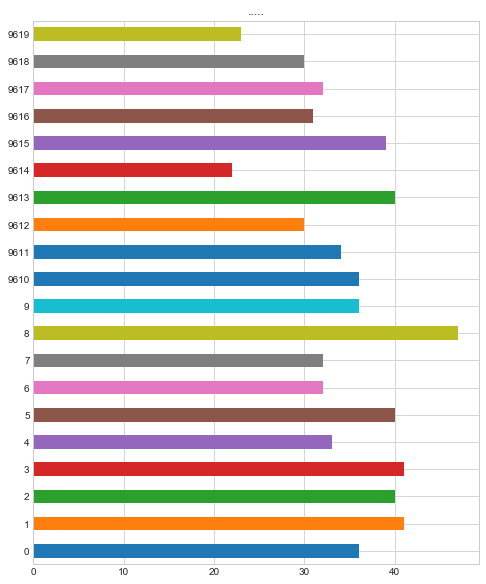

In [168]:
imp_coef = pd.concat([df['age'].head(10),
                     df['age'].tail(10)])

plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title(".....")

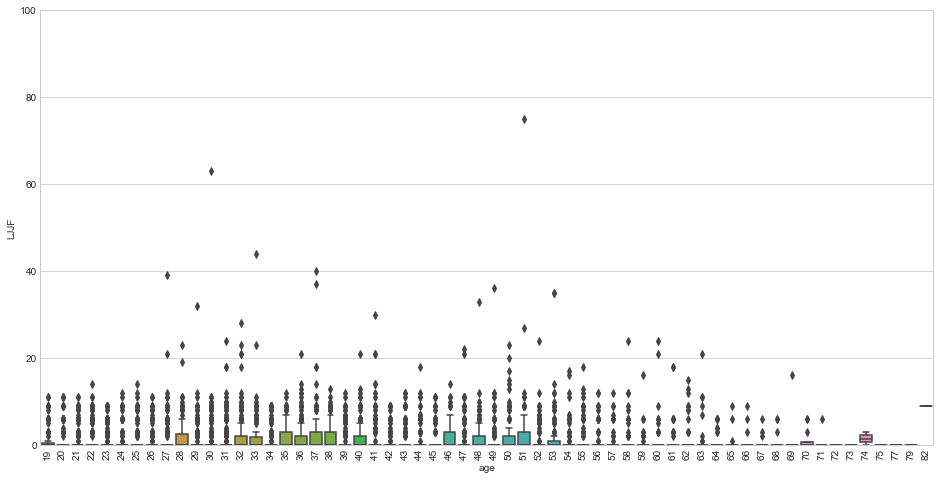

In [157]:
var = 'age'
data = pd.concat([df['LJJF'], df[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y="LJJF", data=data)
fig.axis(ymin=0, ymax=100);
plt.xticks(rotation=90);



/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


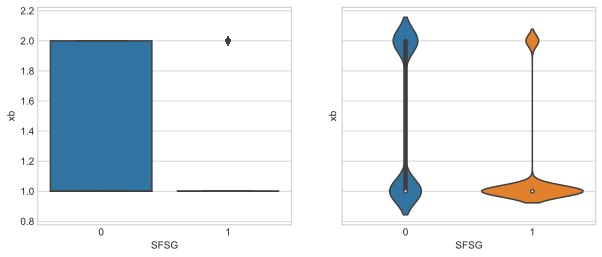

In [200]:
# 让我们分别看下男女的LJJF。我们将创建箱形图和提琴形图。
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4)) 

sns.boxplot(x='SFSG', y='xb',
            data=df, ax=axes[0]);
sns.violinplot(x='SFSG', y='xb', 
               data=df, ax=axes[1]);

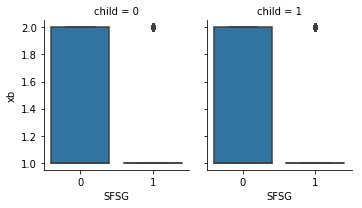

In [73]:
# 当我们想要一次分析两个类别维度下的数量变量时，可以用seaborn库的factorplot()函数。
# 例如，在同一图形中可视化 SFSG 和两个类别变量的相互作用：
sns.factorplot(x='SFSG', y='xb',
               col='child',
               data=df[df['child'] < 20], 
               kind="box", col_wrap=4, size=3, aspect=.8);

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


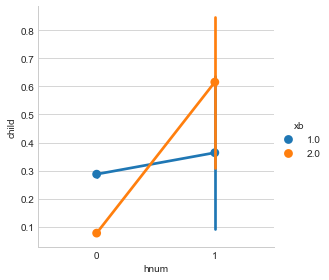

In [152]:
sns.factorplot('hnum','child',hue='xb',data=df)
plt.show()

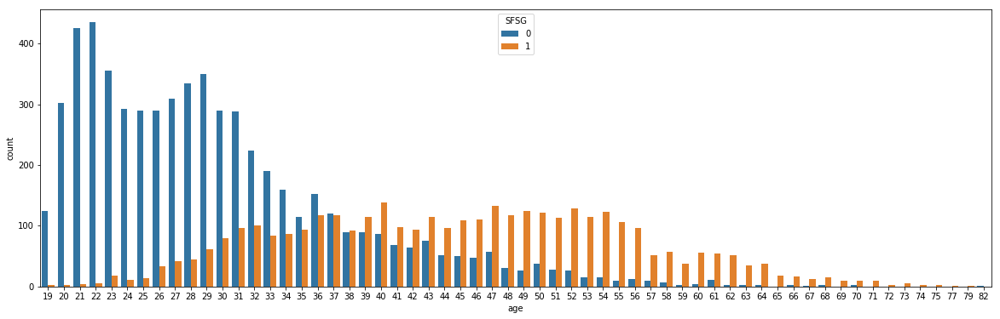

In [85]:
# 看某些值变化是否引起事故变化
plt.figure(figsize=(20, 6))  # 修改图形尺寸
x = sns.countplot(x='age', hue='SFSG', data=df)
plt.show()

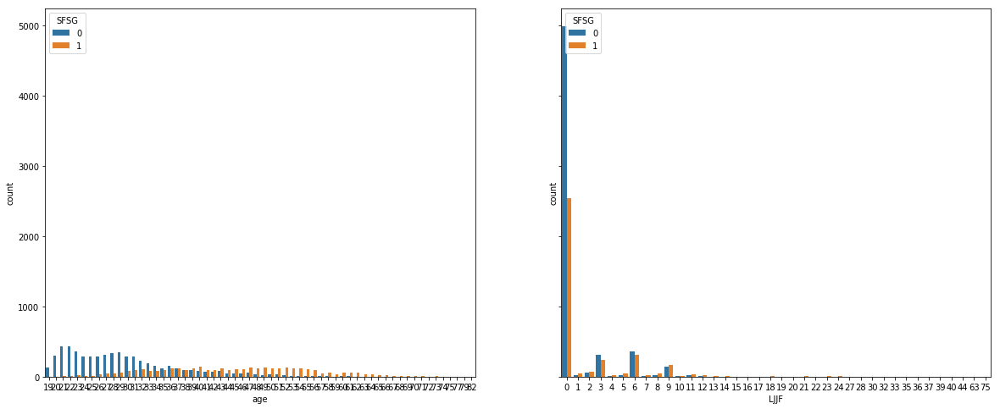

In [89]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(20, 8))

sns.countplot(
    x='age', hue='SFSG', data=df, ax=axes[0])
sns.countplot(
    x='LJJF', hue='SFSG', data=df, ax=axes[1])

In [95]:
# 列联表
# 查看不动驾照事故数量
pd.crosstab(df['child'], df['SFSG']).T



child,0,1
SFSG,,
0,5607,368
1,1894,1751


In [94]:
# 查看比率
df.groupby(['child'])['SFSG'].agg([np.mean]).sort_values(by='mean', ascending=False).T

child,1,0
mean,0.826333,0.2525


In [99]:
# 全数据集可视化
# 降维
# t-SNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
part_df = df[[
    'ZJCX', 'LJJF', 'xb', 'jl',  'marrige', 'child', 'hnum',
    'age', 'XZQH','SSRS','SWRS7','sghpzl' , 'SFSG'
]]



X = part_df.drop(['SFSG', 'XZQH'], axis=1)
# X['International plan'] = X['International plan'].map({'Yes': 1, 'No': 0})
# X['Voice mail plan'] = X['Voice mail plan'].map({'Yes': 1, 'No': 0})

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:617: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/anaconda3/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


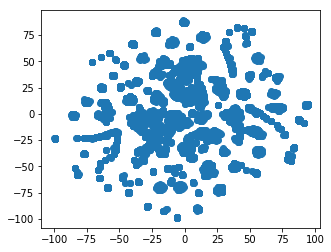

In [101]:
# 图形化展现 t-SNE
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1]);

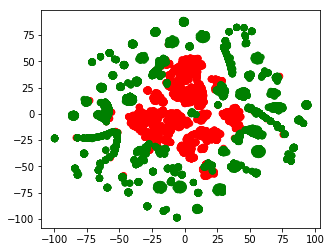

In [102]:
# 加上颜色
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], 
            c=df['SFSG'].map({False: 'green', True: 'red'}));
# 红色集中在中间

In [111]:
# _, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

# for i, name in enumerate(['xb', 'child']):
#     axes[i].scatter(tsne_repr[:, 0], tsne_repr[:, 1],
#                     c=df.reshape(df[name].map({0: 'green', 1: 'red'})))
#     axes[i].set_title(name)

In [112]:
# t-SNE的缺陷：

# 高计算复杂度。scikit-learn的实现在真实任务中往往不太管用。如果你有大量样本，你应该转而使用Multicore-TSNE（多核）。
# 随机数种子的不同会导致图形大不相同，这给解释带来了困难。
# 请参考文末相关资源给出的t-SNE教程。通常而言，你不应该基于这些图像做出任何深远的结论，因为它可能和单纯的猜测差不多。
# 当然，t-SNE图像中的某些发现可能会启发一个想法，这个想法可以通过更全面深入的研究得到确认，但这并不经常发生。

(2, 11)
(2, 11)
(2, 11)
(2, 11)
9.0
7.500909090909093
10.0
3.7520628099173554
[[1.         0.81642052]
 [0.81642052 1.        ]]
LinregressResult(slope=0.5000909090909091, intercept=3.0000909090909103, rvalue=0.8164205163448399, pvalue=0.00216962887307879, stderr=0.11790550059563408)
9.0
7.50090909090909
10.0
3.752390082644628
[[1.         0.81623651]
 [0.81623651 1.        ]]
LinregressResult(slope=0.5000000000000001, intercept=3.000909090909089, rvalue=0.816236506000243, pvalue=0.0021788162369107845, stderr=0.11796374596764074)
9.0
7.5
10.0
3.747836363636364
[[1.         0.81628674]
 [0.81628674 1.        ]]
LinregressResult(slope=0.4997272727272729, intercept=3.002454545454544, rvalue=0.8162867394895984, pvalue=0.002176305279228015, stderr=0.11787766222100221)
9.0
7.500909090909091
10.0
3.7484082644628103
[[1.         0.81652144]
 [0.81652144 1.        ]]
LinregressResult(slope=0.4999090909090909, intercept=3.0017272727272726, rvalue=0.8165214368885028, pvalue=0.002164602347197222, 

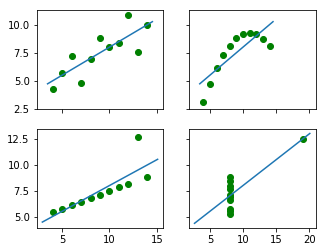

In [119]:
from scipy import stats

# i = np.array(df['xb'])
# ii = np.array(df['xb'])
# iii = np.array(df['xb'])
# iv = np.array(df['xb'])

i = np.array(
    [[10.0, 8.0, 13.0, 9.0, 11.0, 14.0, 6.0, 4.0, 12.0, 7.0, 5.0],
     [8.04, 6.95, 7.58, 8.81, 8.33, 9.96, 7.24, 4.26, 10.84, 4.82, 5.68]])

ii = np.array(
    [[10.0, 8.0, 13.0, 9.0, 11.0, 14.0, 6.0, 4.0, 12.0, 7.0, 5.0],
     [9.14, 8.14, 8.74, 8.77, 9.26, 8.10, 6.13, 3.10, 9.13, 7.26, 4.74]])

iii = np.array(
    [[10.0, 8.0, 13.0, 9.0, 11.0, 14.0, 6.0, 4.0, 12.0, 7.0, 5.0],
     [7.46, 6.77, 12.74, 7.11, 7.81, 8.84, 6.08, 5.39, 8.15, 6.42, 5.73]])

iv = np.array(
    [[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 19.0, 8.0, 8.0, 8.0],
     [6.58, 5.76, 7.71, 8.84, 8.47, 7.04, 5.25, 12.50, 5.56, 7.91, 6.89]])
print(i.shape)
print(ii.shape)
print(iii.shape)
print(iv.shape)

def get_stats(twoDarray):
    print(np.mean(twoDarray[0]))
    print(np.mean(twoDarray[1]))
    print(np.var(twoDarray[0]))
    print(np.var(twoDarray[1]))
    print(np.corrcoef(twoDarray[0], twoDarray[1]))
    print(stats.linregress(twoDarray[0], twoDarray[1]))


for data in (i, ii, iii, iv):
    get_stats(data)


def make_plot(a, b, c, d):
    fig, ((axa, axb), (axc, axd)) = plt.subplots(
        2, 2, sharex='col', sharey='row')
    for arr, ax in ((a, axa), (b, axb), (c, axc), (d, axd)):
        x = arr[0]
        y = arr[1]

        ax.scatter(x, y, c='g')
        m, b = np.polyfit(x, y, 1)
        X = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 100)
        ax.plot(X, m * X + b, '-')
    plt.show()


make_plot(i, ii, iii, iv)

In [122]:
import pandas as pd

# Load the room occupancy dataset
occupancy = os.path.join('data','occupancy_data','datatraining.txt')
occupancy = pd.read_csv(occupancy, sep=',')
occupancy.columns = [
    'date', 'temp', 'humid', 'light', 'co2', 'hratio', 'occupied'
]

# View the occupancy details
print(occupancy.head())
print(occupancy.describe())

# Load the credit card default dataset
credit = os.path.join('data','credit.xls')
credit = pd.read_excel(credit, header=1)
credit.columns = [
    'id', 'limit', 'sex', 'edu', 'married', 'age', 'apr_delay', 'may_delay',
    'jun_delay', 'jul_delay', 'aug_delay', 'sep_delay', 'apr_bill', 'may_bill',
    'jun_bill', 'jul_bill', 'aug_bill', 'sep_bill', 'apr_pay', 'may_pay', 'jun_pay',
    'jul_pay', 'aug_pay', 'sep_pay', 'default'
]

# View the credit details
print(credit.head())
print(credit.describe())

# Load the concrete compression data set
concrete   = pd.read_excel(os.path.join('data','concrete.xls'))
concrete.columns = [
    'cement', 'slag', 'ash', 'water', 'splast',
    'coarse', 'fine', 'age', 'strength'
]

# View the concrete details
print(concrete.head())
print(concrete.describe())

                  date   temp    humid  light     co2    hratio  occupied
1  2015-02-04 17:51:00  23.18  27.2720  426.0  721.25  0.004793         1
2  2015-02-04 17:51:59  23.15  27.2675  429.5  714.00  0.004783         1
3  2015-02-04 17:53:00  23.15  27.2450  426.0  713.50  0.004779         1
4  2015-02-04 17:54:00  23.15  27.2000  426.0  708.25  0.004772         1
5  2015-02-04 17:55:00  23.10  27.2000  426.0  704.50  0.004757         1
              temp        humid        light          co2       hratio  \
count  8143.000000  8143.000000  8143.000000  8143.000000  8143.000000   
mean     20.619084    25.731507   119.519375   606.546243     0.003863   
std       1.016916     5.531211   194.755805   314.320877     0.000852   
min      19.000000    16.745000     0.000000   412.750000     0.002674   
25%      19.700000    20.200000     0.000000   439.000000     0.003078   
50%      20.390000    26.222500     0.000000   453.500000     0.003801   
75%      21.390000    30.533333   256.

(1030, 9)


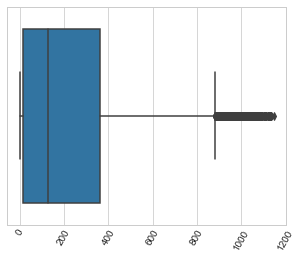

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

def box_viz(df):
    ax = sns.boxplot(df)
    plt.xticks(rotation=60)
    plt.show()
print(concrete.shape)
box_viz(concrete)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


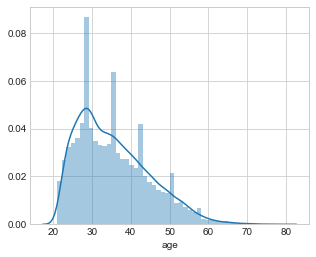

In [125]:
def hist_viz(df,feature):
    ax = sns.distplot(df[feature])
    plt.xlabel(feature)
    plt.show()

hist_viz(credit,'age') # We need to specify a feature vector
# 从直方图可以看出大部分代表性的人都在40岁以下。

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


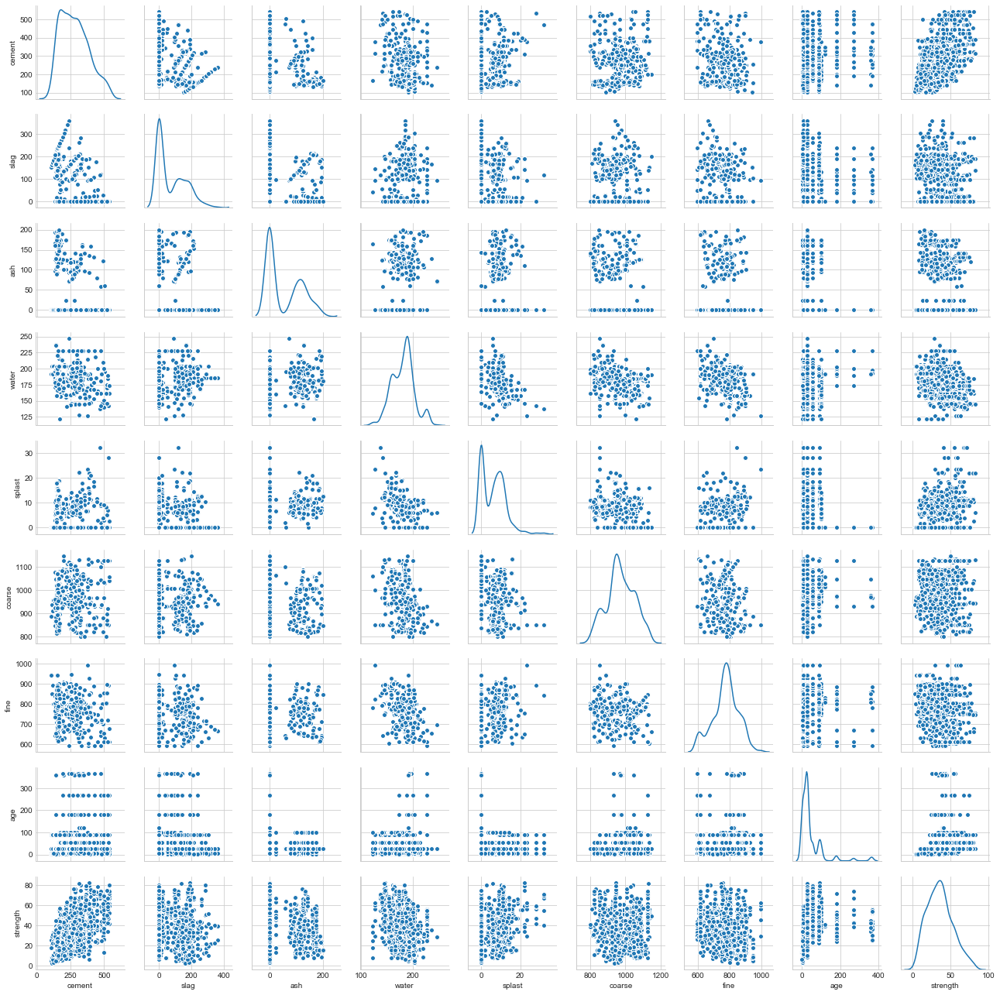

In [126]:
def splom_viz(df, labels=None):
    ax = sns.pairplot(df, hue=labels, diag_kind='kde', size=2)
    plt.show()

splom_viz(concrete)
# 散点图矩阵是非常值得推荐的特征分析工具。
# 我们在散点图中把所有特征配对（每两两特征组合画在一个矩阵中）绘制，对角一般留白或者用来显示核密度估计、直方图或者特征标注。
# 散点图矩阵可以检查两两不同特征之间的关系。
# 我们从散点图矩阵中找出协方差，线性关系、二次关系或者指数关系，同方差或者异方差（代表特征之间分散的程度）。
# 下面混凝土数据集的散点图矩阵，我们可以发现 strength 和 cement 两特征间是异方差。

# 异方差性是相对于同方差而言的。 
# 所谓同方差，是为了保证回归参数估计量具有良好的统计性质，经典线性回归模型的一个重要假定：
#    总体回归函数中的随机误差项满足同方差性，即它们都有相同的方差。

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: 'pandas.tools.plotting.radviz' is deprecated, import 'pandas.plotting.radviz' instead.
  after removing the cwd from sys.path.


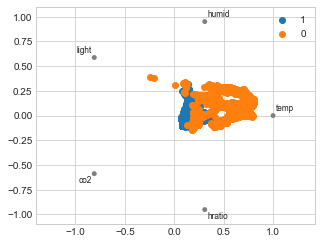

In [127]:
from pandas.tools.plotting import radviz

def rad_viz(df,labels):
    fig = radviz(df, labels, color=sns.color_palette())
    plt.show()

rad_viz(occupancy.ix[:,1:],'occupied') # Specify which column contains the labels

# 从西面房间入住数据集的径向坐标可视化，我们能看到被标注为入住和空缺的房间有些明显的分离。
# 并且，它显示出temperature是可预测的特征之一，因为绿色的点（空缺房间）被拉向圆中的temperature。

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: 'pandas.tools.plotting.parallel_coordinates' is deprecated, import 'pandas.plotting.parallel_coordinates' instead.
  


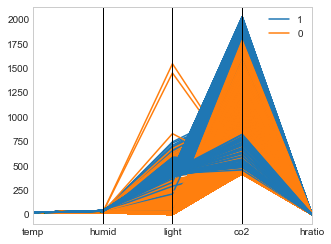

In [128]:
# 平行坐标图
# 平行坐标图，类似于radviz图，是可视化数据集聚类的方法。
# 数据点表示为可连接的线段，x轴的单位没有实际意义，每个竖直线代表一个属性。
# 连接线段的一个集合代表一个实例。紧挨着的点聚成一类，相同颜色的线意味着好的分散性。
from pandas.tools.plotting import parallel_coordinates

def pcoord_viz(df, labels):
    fig = parallel_coordinates(df, labels, color=sns.color_palette())
    plt.show()

pcoord_viz(occupancy.ix[:,1:],'occupied') # Specify which column contains the labels

# 随着数据集维度的增加，即使对于专家，特征分析的挑战也会变大。
# 坦率地讲，没有多少工具可以处理高维数据集。
# 在Python的实现中，径向坐标可视化和radviz图对高维数据集都不是特别好扩展。

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


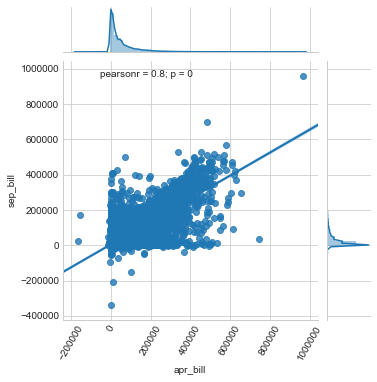

In [129]:
# 双标图（jointplot）
# 一般来讲，维度数目必须通过技术（比如，层次聚合，降维（例如，PCA和LDA）和维度裁剪）来减少。
# 对于维度裁剪，可以使用散点图矩阵生成小倍数的特征。另外一种可行的办法是用双标图来检测每两两特征间的相关性。

# 在下面的双标图，我们检测到每个人四月份第一笔支付和九月最后一笔支付的关系。

def joint_viz(feat1,feat2,df):
    ax = sns.jointplot(feat1, feat2, data=df, kind='reg', size=5)
    plt.xticks(rotation=60)
    plt.show()

joint_viz('apr_bill','sep_bill',credit)

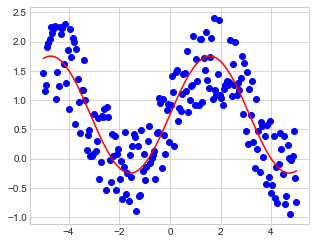

In [130]:
#曲线数据加入噪声
X=np.linspace(-5,5,200)
Y=np.sin(X)
yn=Y+np.random.rand(1,len(Y))*1.5    #噪声

#绘图
fig=plt.figure()
ax=fig.add_subplot(111)
ax.scatter(X,yn,c='blue',marker='o')
ax.plot(X,Y+0.75,'r')
plt.show()

ValueError: Masked arrays must be 1-D

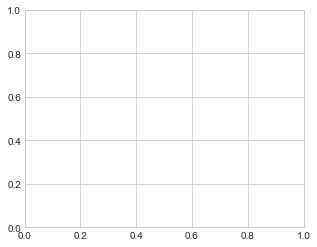

In [132]:
dist=mat([[0.1,0.1],[0.9,0.5],[0.9,0.1],[0.45,0.9],[0.9,0.8],[0.7,0.9],[0.1,0.45],[0.45,0.1]])
m,n=shape(dist)
fig=plt.figure()

ax=fig.add_subplot(111)
ax.scatter(dist.T[0],dist.T[1],c='blue',marker='o')
for point in dist.tolist():
    plt.annotate("("+str(point[0])+","+str(point[1])+")",xy=(point[0],point[1]))
xlist=[]
ylist=[]

for px,py in zip(dist.T.tolist()[0],dist.T.tolist()[1]):
    xlist=append(px)
    ylist=append(py)
ax.plot(xlist,ylist,'r')
plt.show()

In [ ]:
cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = "Validation - Just Do It")
plt.xlabel("alpha")
plt.ylabel("rmse")

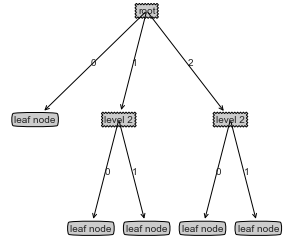

In [136]:
import numpy as np
import matplotlib.pyplot as plt
import treePlotter as tp


myTree={'root':{0:'leaf node',1:{'level 2':{0:'leaf node',1:'leaf node'}},2:{'level 2':{0:'leaf node',1:'leaf node'}}}}
tp.createPlot(myTree)

[5. 4.]


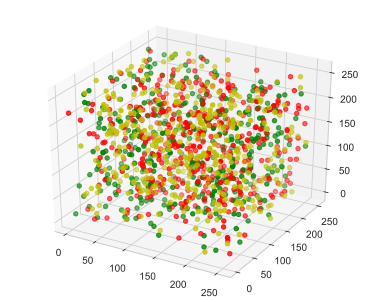

In [201]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 生成数据
data = np.random.randint(0,255,size=[40,40,40])
x,y,z= data[0],data[1],data[2]

# 创建三维对象
fig= plt.figure()
ax = Axes3D(fig)

# 绘制散点图
ax.scatter(x[:10],y[:10],z[:10],c='y')
ax.scatter(x[10:20],y[10:20],z[10:20],c='r')
ax.scatter(x[30:40],y[30:40],z[30:40],c='g')
print(fig.get_size_inches())
# 显示图像
plt.show()

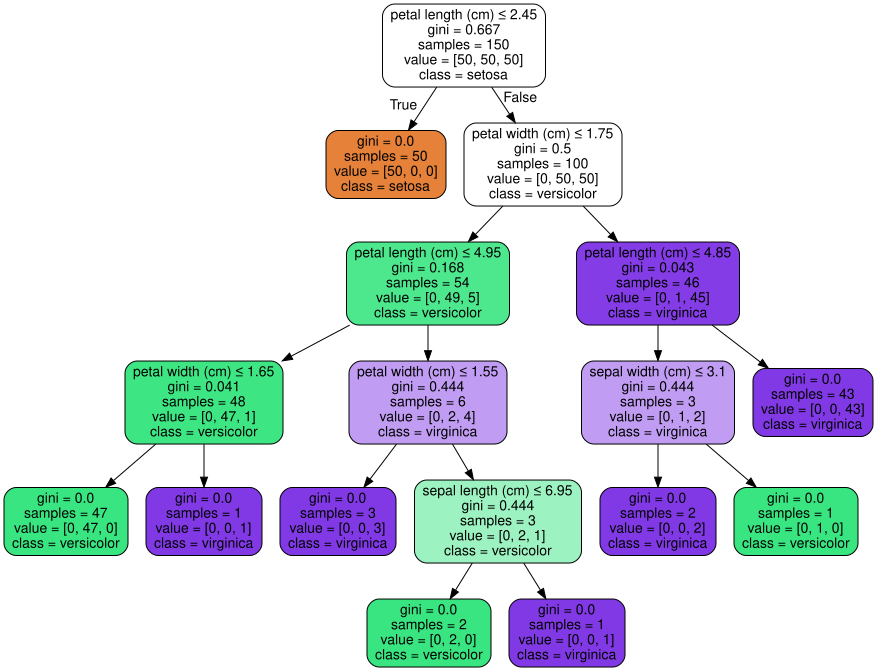

In [148]:
# 查看sklearn构造的决策树模型
import graphviz
from sklearn import tree
from sklearn.datasets import load_iris
from sklearn import tree

from IPython.display import Image  
dot_data = tree.export_graphviz(clf, out_file=None, 
                         feature_names=iris.feature_names,  
                         class_names=iris.target_names,  
                         filled=True, rounded=True,  
                         special_characters=True)  

graph = graphviz.Source(dot_data)
graph

In [140]:
# from sklearn.datasets import load_iris
# from sklearn import tree

# clf = tree.DecisionTreeClassifier()
# iris = load_iris()
# clf = clf.fit(iris.data, iris.target)
# tree.export_graphviz(clf, out_file='trees.txt')

In [149]:
from xgboost import XGBClassifier